<a href="https://colab.research.google.com/github/ormorteey/pistachio_color_analysis/blob/main/pistachio_color_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#### **Install Packages**

In [ ]:
%%capture
!pip install plotly gdown

### **Midterm Code**

#### **Prepare file**

In [ ]:
!gdown 1FV36oTQjIL_pJBDhMxMtj8OEUNdKSKVz

Downloading...
From: https://drive.google.com/uc?id=1FV36oTQjIL_pJBDhMxMtj8OEUNdKSKVz
To: /content/archive.zip
100% 2.79M/2.79M [00:00<00:00, 142MB/s]


In [ ]:
!unzip -o /content/archive.zip

Archive:  /content/archive.zip
  inflating: heart_disease_health_indicators_BRFSS2015.csv  


#### **Import modules**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

#### **Load data**

In [ ]:
data_df = pd.read_csv('heart_disease_health_indicators_BRFSS2015.csv').astype("category")
data_df.head(2)

,HeartDiseaseorAttack,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,Diabetes,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0


In [ ]:
data_df.columns

Index(['HeartDiseaseorAttack', 'HighBP', 'HighChol', 'CholCheck', 'BMI',
       'Smoker', 'Stroke', 'Diabetes', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education',
       'Income'],
      dtype='object')

In [ ]:
data_df.describe()

,HeartDiseaseorAttack,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,Diabetes,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
count,253680.0,253680.0,253680.0,253680.0,253680.0,253680.0,253680.0,253680.0,253680.0,253680.0,...,253680.0,253680.0,253680.0,253680.0,253680.0,253680.0,253680.0,253680.0,253680.0,253680.0
unique,2.0,2.0,2.0,2.0,84.0,2.0,2.0,3.0,2.0,2.0,...,2.0,2.0,5.0,31.0,31.0,2.0,2.0,13.0,6.0,8.0
top,0.0,0.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,9.0,6.0,8.0
freq,229787.0,144851.0,146089.0,244210.0,24606.0,141257.0,243388.0,213703.0,191920.0,160898.0,...,241263.0,232326.0,89084.0,175680.0,160052.0,211005.0,141974.0,33244.0,107325.0,90385.0


#### **Entropy helper functions**

In [ ]:
##Entropy
def entropy(Y):
    """
    Also known as Shanon Entropy
    Reference: https://en.wikipedia.org/wiki/Entropy_(information_theory)
    Args: Y -> A 1D vector/array
    Return: en -> The entropy of the input Y
    """
    unique, count = np.unique(Y, return_counts=True, axis=0)
    prob = count/len(Y)
    en = np.sum((-1)*prob*np.log(prob))
    return en


#Joint Entropy
def jEntropy(Y,X):
    """
    H(Y;X)
    Reference: https://en.wikipedia.org/wiki/Joint_entropy
    Args: Y & X -> Two 1D vectors/arrays
    Return: entropy of a new variable YX, derived from concatenating Y and X
    """
    YX = np.c_[Y,X]
    return entropy(YX)

#Conditional Entropy
def cEntropy(Y, X):
    """
    conditional entropy = Joint Entropy - Entropy of X
    H(Y|X) = H(Y;X) - H(X)
    Reference: https://en.wikipedia.org/wiki/Conditional_entropy
    """
    return jEntropy(Y, X) - entropy(X)


#Information Gain
def gain(Y, X):
    """
    Information Gain, I(Y;X) = H(Y) - H(Y|X)
    Reference: https://en.wikipedia.org/wiki/Information_gain_in_decision_trees#Formal_definition
    """
    return entropy(Y) - cEntropy(Y,X)

In [ ]:
gain(data_df.BMI, data_df.DiffWalk)

0.022495890451508238

#### **Create one variable from mutiple**

In [ ]:
def cont2cat(df, var, bins, new_var_name):
    """
    Convert continuous variable into categorical variable

    Args: df -> dataframe containing the variables to be concatenated
          var (str) -> the name of the variable to be converted. 
          new_var_name (str) -> the name of the newly created variable
    Return: df -> df with an addition column containing the newly created variable
    
    """
    df_ = df.copy()
    if new_var_name == '':
        new_var_name = var
    df_[new_var_name] = pd.cut(x=df_[var], bins=bins, labels=list(range(bins)))
    return df_
  

In [ ]:
def concat_var(df, vars, new_var_name = ''):
    """
    Combine multiple categorical variables into a single variable

    Args: df -> dataframe containing the variables to be concatenated
          vars -> list of variables to be concatenated
          new_var_name -> the name of the newly created variable from the cacatenation process
    Return: df -> df with an addition column containing the newly created variable
    """
    if new_var_name == '':
        new_var_name = '|'.join(vars)
    df_ = df.copy()
    new_vars =  np.c_[df_[vars]]
    df_[new_var_name] = ["|".join(item) for item in new_vars.astype('str')]

    return df_

def contingency_table(df, first_var, second_var):
  return pd.crosstab(df[first_var], df[second_var])


#### **Hierarchical clustering helper functions**

In [ ]:
def rgb2hex(lista):
    """
    Convert rgb to hex color
    Args: lista -> list of 3 numbers representing r, g, and b values i.e [r, g, b]
    Return: The hex of the input lista
    """
    r,g,b = tuple(lista)
    return "#{:02x}{:02x}{:02x}".format(int(r),int(g),int(b))

def mapClusters(df, link, n_clusters = 2, height = None):
    """
    Add the cluster identity of each row of the dataframe to the dataframe
    Args: df -> the dataframe that was clustered
          link -> the hierarchical cluster object
          n_clusters (int) -> the number of clusters to extract from the HC Tree
          height (int) -> the height of the HC tree to use
          Note that if you can either use height or n_cluster but not both to split the HC tree
    """
    df = df.copy()
    if height == None:
        clusters = sch.cut_tree(Z=link, n_clusters=n_clusters)
    else:
        clusters = sch.cut_tree(Z=link, height = height) 
    df['Clusters'] = clusters
    return df


def ColorsPerCluster(df):
    """
    Assign each cluster a color based on their cluster assignment
    Args: df -> A dataframe containing a column named Clusters where the cluster id of each row is stored
    Return: df
    """
    df = df.copy()
    clusters = df['Clusters'].drop_duplicates()
    clustered_colors_list = ['#B0171F', '#FFAEB9', '#CD69C9', '#FF00FF', '#7D26CD', '#0000FF', '#1C86EE',
                        '#00C5CD', '#00FA9A', '#3D9140', '#00CD00', '#B3EE3A', '#FFD700',
                        '#CD8500', '#FF9912' , '#8B4513', '#EE4000', '#C0C0C0', '#2B2B2B',
                        '#8E8E38', '#EEB4B4']
    for ii in range(clusters.shape[0]):
        df.loc[df['Clusters'] == ii, 'ClusterColor'] = clustered_colors_list[ii]

    return df
    
# TWO COLORMAPS
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib as mpl

import scipy.cluster.hierarchy as sch
def doClustering(df, to_cluster = None, num_cluster = None, toPlot = True):
    """
    Performs hierarchical clustering of a dataframe based on some given columns
    Args: df -> dataframe to be clustered
          to_cluster (list) -> a list of columns (may be subset of df) to use for the clustering
          num_cluster (int) -> number of clusters to generate
          toPlot (bool) -> plot dendogram
    """
    if to_cluster == None:
        to_cluster = df.columns
    link = sch.linkage(df[to_cluster], method='ward')
    dfCluster = ColorsPerCluster(mapClusters(df, link, num_cluster))

    clustered_colors_list = ['#B0171F', '#FFAEB9', '#CD69C9', '#FF00FF', '#7D26CD', '#0000FF', '#1C86EE',
                        '#00C5CD', '#00FA9A', '#3D9140', '#00CD00', '#B3EE3A', '#FFD700',
                        '#CD8500', '#FF9912' , '#8B4513', '#EE4000', '#C0C0C0', '#2B2B2B',
                        '#8E8E38', '#EEB4B4']
   
    clustered_leaf_labels = dfCluster.values[:,-1]

    plt.clf()
    fig = plt.figure(figsize=(25, 10))
    dn = sch.dendrogram(link )
    dn['color_list'] = clustered_colors_list

    plt.rcParams.update({"font.size":16})
    plt.rcParams["axes.labelweight"] = "bold"
    plt.rcParams["font.weight"] = "bold"
    ax = plt.gca()

    x_points = ax.get_xticks()
    y_points = np.zeros(len(x_points))
    xlbls = ax.get_xmajorticklabels()
    # print(ax.get_position())
    color_idx = []
    clustered_colors_list = []

    # retrieve clustered colors and unclustered colors
    for lbl in xlbls:
        color_idx.append(int(lbl.get_text()))
        clustered_colors_list.append(clustered_leaf_labels[int(lbl.get_text())])

    # get axis position [x0,y0,width,height]
    ax_bbox = ax.get_position()
    # cax1 = fig.add_axes([ax_bbox.x0, 0.01, ax_bbox.width, 0.05])
    cax1 = fig.add_axes([ax_bbox.width+0.15, ax_bbox.y0, 0.025, ax_bbox.height-0.05])

    # create custom colorbar
    clusterLabel = dfCluster[['Clusters', 'ClusterColor']].drop_duplicates()
    unclustered_colors_list = clusterLabel['ClusterColor'].values
    x_pointsUnclustered = clusterLabel['Clusters'].values
    
    cmap = mpl.colors.ListedColormap(unclustered_colors_list)
    norm = mpl.colors.BoundaryNorm(np.arange(-0.5,clusterLabel.shape[0]), cmap.N) 
    sc1 = plt.scatter(x_pointsUnclustered, np.zeros(len(x_pointsUnclustered)), c = clusterLabel['Clusters'], cmap=cmap, norm=norm)
    unclustered_cb = plt.colorbar(sc1, cax=cax1,  orientation='vertical', spacing='proportional', ticks=np.linspace(0,19,20))
    # unclustered_cb.set_label('cluster id', loc='center', rotation=270, labelpad=30)
    unclustered_cb.ax.set_title('Cluster Id', loc='center', pad=10, fontsize=16, fontweight='bold')
    # set the size of nex axis [x0,y0,width,height]
    cax2 = fig.add_axes([ax_bbox.x0, 0.065, ax_bbox.width, 0.05])
    cm2 = LinearSegmentedColormap.from_list('custom_colormap', clustered_colors_list, N=len(clustered_colors_list))
    sc2 = plt.scatter(x_points, y_points, c=color_idx, cmap=cm2)
    clustered_cb = plt.colorbar(sc2, cax=cax2,  orientation='horizontal', pad = 0.3)

    # remove ticks and labels
    ax.set_xticklabels([])
    clustered_cb.ax.tick_params(size=0)
    clustered_cb.ax.set_xticklabels([])
    if len(to_cluster) < 1:
      title = to_cluster[0]
    else:
      title = 'Dendogram for ' + ', '.join(to_cluster[:-1])
      title += ' & ' + to_cluster[-1]
    title += f' with {num_cluster} clusters'

    
    ax.set_title(title , loc='center', pad=10, fontsize=16, fontweight='bold')

    if not toPlot:
        plt.close()
  
    return(dfCluster)


In [ ]:
#### Data is super large so you need a computing resource with enough memory

data_df_cluster = doClustering(data_df.iloc[:20, :], to_cluster = ['BMI', 'DiffWalk'], num_cluster = 5, toPlot = True)

<Figure size 640x480 with 0 Axes>

Error in callback <function flush_figures at 0x7f3f9da112d0> (for post_execute):


KeyboardInterrupt: ignored

#### **May 3 Class**

In [ ]:
data_df.columns

Index(['HeartDiseaseorAttack', 'HighBP', 'HighChol', 'CholCheck', 'BMI',
       'Smoker', 'Stroke', 'Diabetes', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education',
       'Income'],
      dtype='object')

Y -> HeartDiseaseorAttack

X1 -> HighBP

X2 -> HighChol

In [ ]:
Y = data_df['HeartDiseaseorAttack']
X1 = data_df['HighBP']
X2 = data_df['HighChol']

To get the association of X1 -> Y, we need the conditional probability Pr(Y=1|X1 = 1) = ?. Similarly, we need the conditional probability Pr(Y=1|X1 = 0) = ?

We need the contigency table to compute these probabilities

In [ ]:
contigency_y_X1 = contingency_table(df=data_df, first_var='HeartDiseaseorAttack', second_var='HighBP')
contigency_y_X1

HighBP,0.0,1.0
HeartDiseaseorAttack,,
0.0,138886,90901
1.0,5965,17928


We can compute the conditional entropy CE(Y|X1) based on the contigency table

In [ ]:
cond_prob_y_X1 = contigency_y_X1.apply(lambda x: x/sum(x), axis=1)
cond_prob_y_X1

HighBP,0.0,1.0
HeartDiseaseorAttack,,
0.0,0.604412,0.395588
1.0,0.249655,0.750345


To get the CE(Y|X=1), we can do

In [ ]:
Y_when_X_is_0, X_is_0 = data_df.loc[data_df.HighBP == 0, 'HeartDiseaseorAttack'], data_df.loc[data_df.HighBP == 0, 'HighBP']
print(f'CE(HeartDiseaseorAttack|HighBP =0) is {cEntropy(Y_when_X_is_0, X_is_0)}')
Y_when_X_is_1, X_is_1 = data_df.loc[data_df.HighBP == 1, 'HeartDiseaseorAttack'], data_df.loc[data_df.HighBP == 1, 'HighBP']
print(f'CE(HeartDiseaseorAttack|HighBP=1) is  {cEntropy(Y_when_X_is_1, X_is_1)}')
Y, X = data_df.HeartDiseaseorAttack, data_df.HighBP
print(f'overall CE(HeartDiseaseorAttack|HighBP) is {cEntropy(Y, X)}')


CE(HeartDiseaseorAttack|HighBP =0) is 0.17167706781892994
CE(HeartDiseaseorAttack|HighBP=1) is  0.44743965245768946
overall CE(HeartDiseaseorAttack|HighBP) is 0.28997952100267155


To find all the CE for the variables:
i.e CE(Y|X1), CE(Y|X2), CE(Y|X3), CE(Y|X4), ... CE(Y|Xn)

In [ ]:
CE_all_var = [cEntropy(data_df.HeartDiseaseorAttack, data_df[var]) for var in data_df.columns]
MI_all_var = [gain(data_df.HeartDiseaseorAttack, data_df[var]) for var in data_df.columns]

CE_df = pd.DataFrame({'var':data_df.columns, 'CE':CE_all_var, 'MI':MI_all_var})
CE_df.sort_values('CE', ascending=False, inplace=True)
CE_df

CE and MI are inversely propotional. You minimize CE, you maximize MI

To go a little more deeper, we can explore the association within the categories of the variables and the response.

In [ ]:
CE_all_var = np.array([( var, item, cEntropy(data_df.loc[data_df[var] == item, 'HeartDiseaseorAttack'], data_df.loc[data_df[var] == item, var])) 
              for var in data_df.columns for item in data_df[var].unique() ])
MI_all_var = np.array([( var, item, gain(data_df.loc[data_df[var] == item, 'HeartDiseaseorAttack'], data_df.loc[data_df[var] == item, var])) 
              for var in data_df.columns for item in data_df[var].unique() ])

CE_all_var = pd.DataFrame(CE_all_var, columns = ['CE_var_name', 'CE_vcategory', 'CE'])
MI_all_var = pd.DataFrame(MI_all_var, columns = ['MI_var_name', 'MI_category', 'MI'])

analysis_df = pd.concat([CE_all_var, MI_all_var], axis=1, join='inner', )
analysis_df

You should notice that the mutual information is zero for all. Think a little bit about this and see if you could figure out why?

Now lets sort the result by CE and see which categories we can combie together to give a better CE

In [ ]:
analysis_df. sort_values('CE', ascending=False, inplace=True)
analysis_df.reset_index(inplace=True, drop=True)
analysis_df.head(10)

In [ ]:
analysis_df.loc[analysis_df.CE_var_name == 'BMI', :]

#### **Combining Multiple Variables**

Let's combine a couple of variables to form a new variable

In [ ]:
temp_data = concat_var(data_df, ['Fruits', 'PhysHlth', 'Sex'])
for col in temp_data.columns:
  temp_data[col] = temp_data[col].astype('category')
display(temp_data.head(3))

In [ ]:
display(temp_data[['HeartDiseaseorAttack',	'HighBP',	'HighChol', 'DiffWalk', 'Fruits|PhysHlth|Sex']].head())

In [ ]:
cEntropy(temp_data['HeartDiseaseorAttack'].tolist(), temp_data['Fruits|PhysHlth|Sex'].tolist() )

In [ ]:
contingency_table(df=temp_data.iloc[:10, :], first_var='Fruits|PhysHlth|Sex', second_var='HeartDiseaseorAttack')

Let's compute CE for all possible levels of the new variable

In [ ]:
CE_var = np.array([( item, cEntropy(temp_data.loc[temp_data['Fruits|PhysHlth|Sex'] == item, 'HeartDiseaseorAttack'].tolist(), 
                                    temp_data.loc[temp_data['Fruits|PhysHlth|Sex'] == item, 'Fruits|PhysHlth|Sex'].tolist())) 
                                    for item in temp_data['Fruits|PhysHlth|Sex'].unique() ])

CE_var_df = pd.DataFrame(CE_var, columns = ['level', 'CE'])
CE_var_df.CE = np.round_(CE_var_df.CE.astype('float'), 4)
CE_var_df.sort_values('CE').reset_index(drop=True)

### **Final Project Code**

#### **Import modules**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
import skimage.io as skio
from skimage.color import rgb2gray, rgba2rgb, hsv2rgb
from tqdm import notebook as tqdm
from skimage.transform import resize
import os
import gdown

from tqdm.notebook import tqdm


import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

#### **May 15**

##### **Download Files**

Please find your own way of downloading the file from the internet

In [ ]:
# from google.colab import drive, files
# drive.mount('/content/drive')

In [ ]:
# !unzip -o /content/drive/MyDrive/Colab\ Notebooks/Data/Shot\ Marilyn.zip
# !rm -rf __MACOSX/

In [ ]:
!gdown 1S_VpiAiCClJYpASb3reYTq3K5Gdxs722

Downloading...
From: https://drive.google.com/uc?id=1S_VpiAiCClJYpASb3reYTq3K5Gdxs722
To: /content/shot marilyns.zip
100% 5.13M/5.13M [00:00<00:00, 97.3MB/s]


In [ ]:
!unzip -o shot\ marilyns.zip

Archive:  shot marilyns.zip
   creating: shot marilyns/
  inflating: shot marilyns/shot_red_marilyn_1964-19604.png  
  inflating: shot marilyns/shot_blue_marilyn_1964-19604.jpg  
  inflating: shot marilyns/shot_orange_marilyn_1964-19604.png  
  inflating: shot marilyns/shot_turq_marilyn_1964-19604.png  
  inflating: shot marilyns/shot_eggblue_marilyn_1964-19604.png  


##### **Load Images**

In [ ]:
filepaths = glob('shot marilyns/*')

# filepaths = glob('Shot Marilyn/*')

print(filepaths)

['shot marilyns/shot_blue_marilyn_1964-19604.jpg', 'shot marilyns/shot_orange_marilyn_1964-19604.png', 'shot marilyns/shot_turq_marilyn_1964-19604.png', 'shot marilyns/shot_eggblue_marilyn_1964-19604.png', 'shot marilyns/shot_red_marilyn_1964-19604.png']


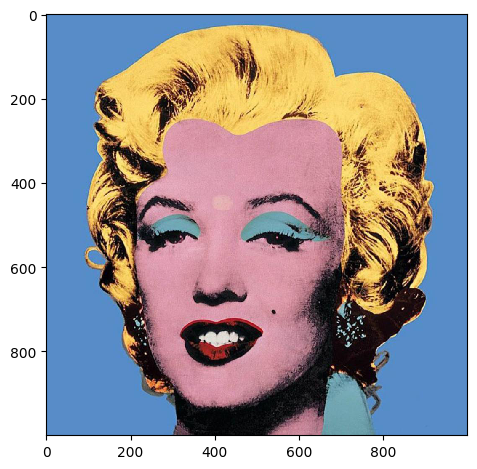

In [ ]:
img = skio.imread(filepaths[0])
skio.imshow(img)

In [ ]:
print(f'Image dimension is {img.shape}')
print(f'Few pixels: \n {img[1:3, 1:5,:]}')

Image dimension is (1000, 1000, 3)
Few pixels: 
 [[[ 88 140 200]
  [ 88 140 200]
  [ 88 140 200]
  [ 88 140 200]]

 [[ 88 140 200]
  [ 88 140 200]
  [ 88 140 200]
  [ 88 140 200]]]


It appears the images has an extra coordinate. This does not look like RGBA or CYMK. Let's take a quick look at the last coordinate

No real information, so we ignore it

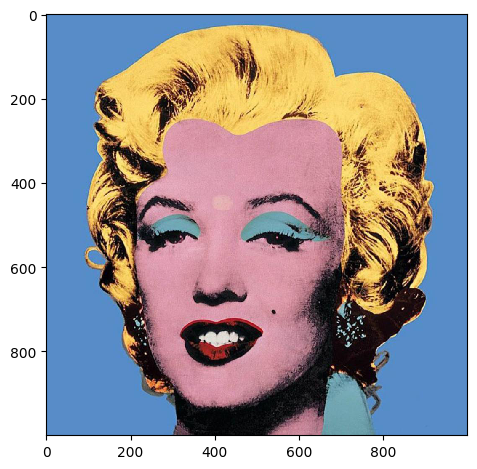

In [ ]:
img = img[:, :, :3]
skio.imshow(img)

Let's resize all images to 512 by 512. The resizing is done inplace, so no need to mess with the filesystem.

In [ ]:
def resize_img(filepaths, height=1000, width=1000, save_dir='shot marilyns', do_zip = False):
  """
  To resize the images, the code uses os.makedirs(save_dir, exist_ok = True) and iterates through each filepath in the list. 
  The image is read using skio.imread(filepath) and then resized to the desired height and width using resize(img_, (height, width)). 
  The resized image is then saved using plt.imsave(). 
  If needed, the images can be zipped using the command os.system("zip -r shot\ marilyns.zip shot\ marilyns"). 
  The progress is displayed using tqdm().
  """
  os.makedirs(save_dir, exist_ok = True)
  for i, filepath in enumerate(tqdm(filepaths, desc='Resizing')):
    img_ = skio.imread(filepath)
    img_ = resize(img_, (height, width))
    plt.imsave(os.path.join(save_dir, ''.join(filepath.split('/')[1:])), img_)
  if do_zip:
    os.system("zip -r shot\ marilyns.zip shot\ marilyns")

img_shape = 512, 512
resize_img(filepaths, height=img_shape[0], width=img_shape[1], save_dir='shot marilyns', do_zip=True)

Resizing:   0%|          | 0/5 [00:00<?, ?it/s]

We can plot the resized images


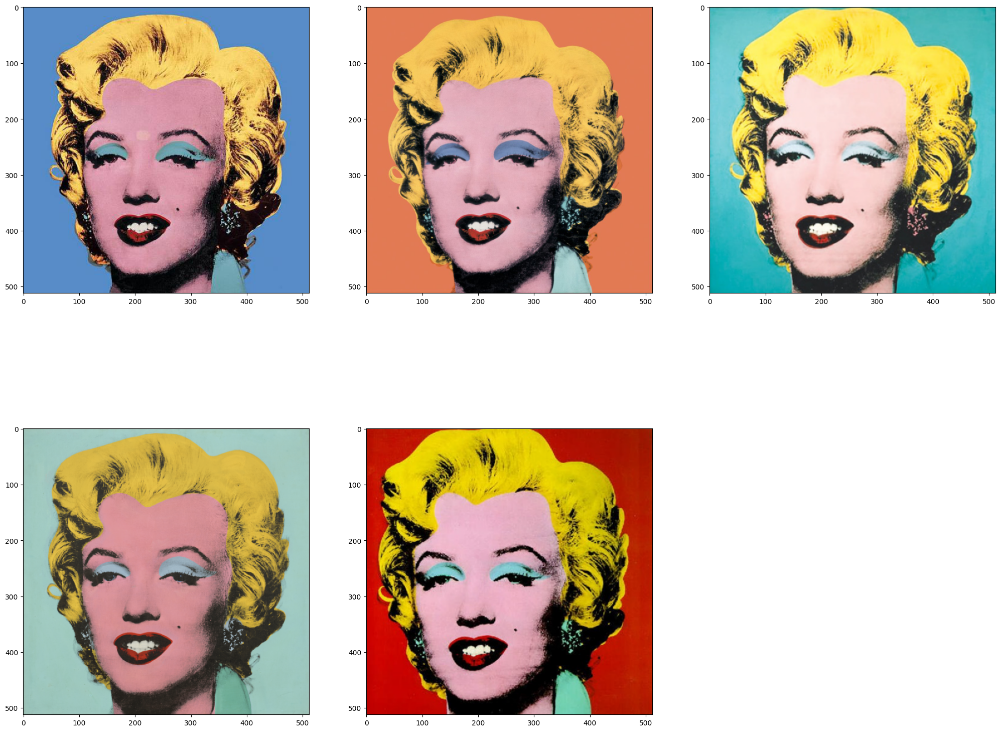

In [ ]:
def plot_shot_marilyns(filepaths):
  """
  This function plots the images located in the given filepaths.
  It creates a figure with a height of 20 and a width of 25. 
  The images are arranged in a 2x3 grid. For each filepath, the function reads the image and places it in the appropriate position on the grid. 
  The final image in the bottom right corner is turned off. 
  Simply call the function with the appropriate filepaths to display the images.

  """
  fig, ax = plt.subplots(2,3)
  fig.set_figheight(20)
  fig.set_figwidth(25)
  row_, col_ = -1, 0
  for i, filepath in enumerate(filepaths):
    img_ = skio.imread(filepath)
    row_, col_ = (row_ + 1,  0) if (i%3 == 0) else (row_,  col_ + 1)
    ax[row_, col_].imshow(img_)
  ax[1,2].set_axis_off()

plot_shot_marilyns(filepaths)


We need to extract the channels for all the images

In [ ]:
def get_channels(filepaths):
  """
  convert images in filepath to a dataframe containing their RGB channel values.
  The number suffix represents the index of the image
  """
  img_list = []
  for i, filepath in enumerate(filepaths):
    img_ = skio.imread(filepath)[:, :, :3]
    img_ = img_.reshape((img_.shape[0] * img_.shape[1], img_.shape[2]))
    img_list.append(pd.DataFrame(img_, columns=[item + str(i) for item in ['R', 'G', 'B']]))

  return(pd.concat(img_list, axis = 1))

rgb_df = get_channels(filepaths)    
rgb_df


,R0,G0,B0,R1,G1,B1,R2,G2,B2,R3,G3,B3,R4,G4,B4
0,88,140,200,218,112,103,89,195,188,150,184,172,177,25,6
1,88,140,200,227,113,97,86,192,186,150,185,173,176,23,6
2,88,140,200,216,121,92,87,191,186,149,184,173,175,19,4
3,88,140,200,223,117,74,88,189,185,152,186,174,173,14,1
4,88,140,200,225,117,72,87,187,185,154,187,176,172,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
262139,88,140,198,208,125,85,0,164,163,156,191,179,176,33,5
262140,88,140,198,217,121,75,1,164,163,155,189,178,176,34,5
262141,88,140,198,218,124,79,1,164,163,155,189,177,173,34,4
262142,88,140,198,219,123,74,0,164,162,154,188,177,170,34,3


If we neeed to, here is a helper function to find the rgb value for a pixel in an image. img_indx is the index of the image filepath

In [ ]:
def get_pixel_val(file, row_, col_, img_indx=None):
  """
  get the RGB value for a pixel (row, col)
  """
  try:
    if isinstance(file, pd.DataFrame) and img_indx != None:
      res = file.iloc[row_ * 750 + col_, (img_indx * 3):(img_indx * 3)+3 ]
    else:

      img_ = skio.imread(file)[:, :, :3]
      res = img_[row_, col_, :]
    return res
  except Exception as e:
    print(e)
    print('File parameter must be either a dataframe or an image file path')
    print('If you provided a dataframe, make sure to provide the image index parameter')

print(get_pixel_val(file = filepaths[0], row_=2, col_=0))
print(get_pixel_val(file = get_channels(filepaths) , row_=2, col_=0, img_indx=0))

[ 88 140 200]
R0     88
G0    140
B0    200
Name: 1500, dtype: uint8


We can construct the cubes and slide them across the image. Let's choose the first image for this and all subsequent operations

In [ ]:
def axis_mask(val, base):
    """
    Construct sliding kernel for centers based on cube dimension i.e base
    """
    if val == 0:
        inf_mask = 0
        sup_mask = base
    elif val == base:
        inf_mask = 0
        sup_mask = base
    elif val % base == 0:
        inf_mask = val - base
        sup_mask = val
    else:
        inf_mask = base * np.floor(val/base) # closest mulitple of 
        sup_mask = base * np.ceil(val/base)
    return((int(inf_mask), int(sup_mask)))


def get_bounding_cubes(data, step = 3):
    """
    Get centers using mask
    """
    data_masks = [] 
    mask_center = []
    for pos, row in tqdm(enumerate(data), total=len(data)):
        x_mask = axis_mask(val=row[0], base=step )
        y_mask = axis_mask(val=row[1], base=step )
        z_mask = axis_mask(val=row[2], base=step)
        center_x = np.median(range(x_mask[0], x_mask[1] + 1))
        center_y = np.median(range(y_mask[0], y_mask[1] + 1))
        center_z = np.median(range(z_mask[0], z_mask[1] + 1))
        data_masks.append((x_mask,y_mask, z_mask))
        mask_center.append((int(center_x), int(center_y), int(center_z)))

    return(data, data_masks, mask_center)

  0%|          | 0/262144 [00:00<?, ?it/s]

<Figure size 640x480 with 0 Axes>

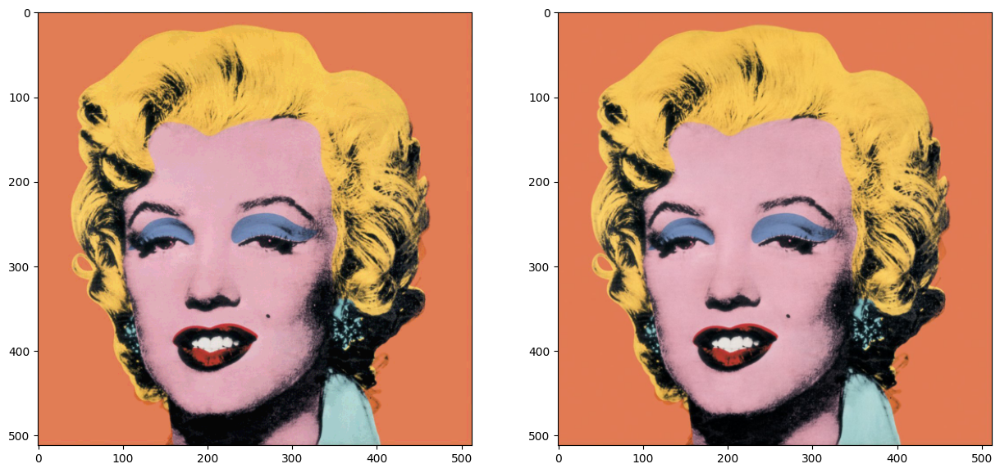

In [ ]:
def make_center_df(df, cols=[], img_shape=(1000, 1000), cube_width = 3, to_plot=False, return_result=True):
  """
  Return dataframe of image representing the RGB of reduced dimension (i.e using centers)
  """
  if not isinstance(cols, list):
    raise Exception("cols must be a list of columns from the dataframe")
  if len(cols) < 1:
    cols = df.columns
    df_ = df.copy
  else:
    df_ = df.copy()
    df_ = df_[cols]

  boxes = get_bounding_cubes(df_.values, step = cube_width)

  old_img = np.array(boxes[2]).reshape([img_shape[0], img_shape[1], 3])

  new_img = np.array(df_.values).reshape([img_shape[0], img_shape[1], 3])
  center_df = pd.DataFrame(boxes[2])
  center_df.columns = [col + ' center' for col in df_.columns]
  res = pd.concat([df_, center_df], axis=1)
  if to_plot:
    plt.figure(figsize=(8, 6), dpi=80)
    fig, (ax1, ax2) = plt.subplots(1,2)
    fig.set_figheight(15)
    fig.set_figwidth(15)

    ax1.imshow(old_img)
    ax2.imshow(new_img)
  if return_result:
    return(res)

# get the dataframe representing each pixel and their centers using a 10 by 10 cube. We also plot the original image and the center image
center_df = make_center_df(df=rgb_df, cols=list(rgb_df.columns[3:6]), img_shape=img_shape, cube_width = 10, to_plot=True)

In [ ]:
import scipy.cluster.hierarchy as sch
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable


def rgb2hex(rgb):
  """
  Convert RGB to hexadecimal
  """
  try:
    r, g, b = tuple(rgb)
    return "#{:02x}{:02x}{:02x}".format(int(r),int(g),int(b))
  except:
    print(f'failed rgb {rgb}')

def make_plot_dendogram(df, rgb_cols, cluster_color_col, link):
  df_ = df.copy()
  clustered_leaf_labels = df_[cluster_color_col].values
  unclustered_leaf_labels = list(map(rgb2hex, df_[rgb_cols].values))

  plt.clf()
  fig = plt.figure(figsize=(25, 10))
  dn = sch.dendrogram(link )
  ax = plt.gca()

  x_points = ax.get_xticks()
  y_points = np.zeros(len(x_points))
  xlbls = ax.get_xmajorticklabels()
  # print(ax.get_position())
  color_idx = []
  clustered_colors_list = []
  unclustered_colors_list = []

  # retrieve clustered colors and unclustered colors
  for lbl in xlbls:
      color_idx.append(int(lbl.get_text()))
      clustered_colors_list.append(clustered_leaf_labels[int(lbl.get_text())])
      unclustered_colors_list.append(unclustered_leaf_labels[int(lbl.get_text())])
  # get axis position [x0,y0,width,height]
  ax_bbox = ax.get_position()
  cax1 = fig.add_axes([ax_bbox.x0, 0.01, ax_bbox.width, 0.05])

  # create custom colorbar
  cm1 = LinearSegmentedColormap.from_list('custom_colormap', clustered_colors_list, N=len(clustered_colors_list))
  sc1 = plt.scatter(x_points, y_points, c=color_idx, cmap=cm1)
  clustered_cb = plt.colorbar(sc1, cax=cax1,  orientation='horizontal')

  # set the size of nex axis [x0,y0,width,height]
  cax2 = fig.add_axes([ax_bbox.x0, 0.065, ax_bbox.width, 0.05])
  cm2 = LinearSegmentedColormap.from_list('custom_colormap', unclustered_colors_list, N=len(unclustered_colors_list))
  sc2 = plt.scatter(x_points, y_points, c=color_idx, cmap=cm2)
  unclustered_cb = plt.colorbar(sc2, cax=cax2,  orientation='horizontal', pad = 0.3)

  # remove ticks and labels
  ax.set_xticklabels([])

  # clustered_cb.ax.set_ylabel(ylabel='Clustered', rotation=270, loc='center', fontsize=20, labelpad=25)
  # unclustered_cb.ax.set_ylabel(ylabel='Unclustered', rotation=270, loc='center', fontsize=20, labelpad=25)
  clustered_cb.ax.tick_params(size=0)
  unclustered_cb.ax.tick_params(size=0)
  clustered_cb.ax.set_xticklabels([])
  unclustered_cb.ax.set_xticklabels([])
  plt.show()

def ColorsSequence3DScatterPerCluster(df):
    df_ = df.copy()
    clusters = df_['Clusters'].drop_duplicates()
    for ii in range(clusters.shape[0]):
        colors = df_.query('Clusters == {}'.format(ii))
        color_rep = colors.sample(n=1, random_state = 1).values
        color_rep = color_rep[0][0:3]
        df_.loc[df_['Clusters'] == ii, 'ClusterColor'] = rgb2hex(color_rep)

    return df_

def mapClusters(df, link, n_clusters = 2, height = None):
    df_ = df.copy()
    if height == None:
        clusters = sch.cut_tree(Z=link, n_clusters=n_clusters)
    else:
        clusters = sch.cut_tree(Z=link, height = height) 
    df_['Clusters'] = clusters
    return df_

def cluster_center(df, center_cols, n_cluster, plot_dendogram = True):
  df_ = df.copy()
  df_center_unique = df_[center_cols].drop_duplicates()
  link = sch.linkage(df_center_unique, method='ward')
  df_center_unique = ColorsSequence3DScatterPerCluster(mapClusters(df_center_unique, link, n_cluster))
  df__ = pd.merge(df_, df_center_unique, how='right', on=center_cols).drop_duplicates(subset=center_cols)
  df_ = pd.merge(df_, df_center_unique, how='left', on=center_cols)

  if plot_dendogram:
    make_plot_dendogram(df=df__, rgb_cols=center_cols, cluster_color_col='ClusterColor', link=link)
  return(df_)


In [ ]:
center_df

<Figure size 640x480 with 0 Axes>

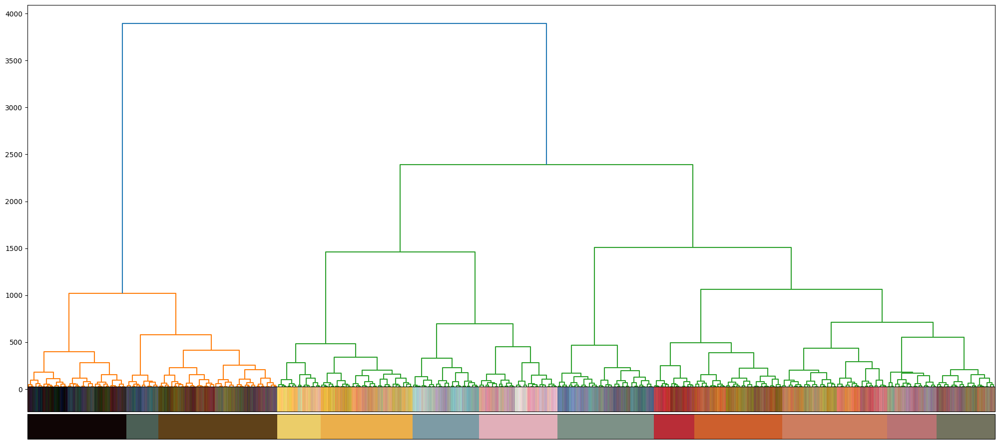

,R1,G1,B1,R1 center,G1 center,B1 center,Clusters,ClusterColor
0,218,112,103,215,115,105,0,#cd7d5f
1,227,113,97,225,115,95,0,#cd7d5f
2,216,121,92,215,125,95,0,#cd7d5f
3,223,117,74,225,115,75,0,#cd7d5f
4,225,117,72,225,115,75,0,#cd7d5f
5,225,117,72,225,115,75,0,#cd7d5f


In [ ]:
# plot the dendogram of unique centers and their chosen representative color. Representative via random sampling. You may want to experiement with 
# other way of getting a representative e.g average of all the RGB in that cluster 
cluster_center_df = cluster_center(df=center_df, center_cols=['R1 center', 'G1 center', 'B1 center'], n_cluster=13)
cluster_center_df.head(6)

Now, we explore the distribution of the clusters. Try hover them

In [ ]:

def plot_3D_centers(df, center_cols, color_col, cluster_col):
  """
  Plot the 3D centers
  """
  df_ = df.copy()
  x, y, z = center_cols
  fig = go.Figure()
  fig.add_trace(
      go.Scatter3d(
          x=df_[x],
          y=df_[y],
          z=df_[z],
          # customdata=np.stack((df_by_continent['country'], df_by_continent['pop']), axis=-1),
          customdata= df_[[cluster_col]].values,
          mode='markers',
          opacity=0.7,
          marker={'size': 8, 'color':df_[color_col]},
          hovertemplate='<b>x</b>: %{x}<br>' +
                        '<b>y</b>: %{y}<br>' +
                        '<b>z</b>: %{z}<br>' +
                        '<b>cluster</b>: %{customdata[0]}<br>' +
                        '<extra></extra>' 
      )
  )

  fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
  fig.show()

plot_3D_centers(df=cluster_center_df, center_cols=['R0 center', 'G0 center', 'B0 center'], color_col='ClusterColor', cluster_col='Clusters')

We can color one or some clusters to see which part they cover on the image. We can color them with purple since purple is not really in the image 

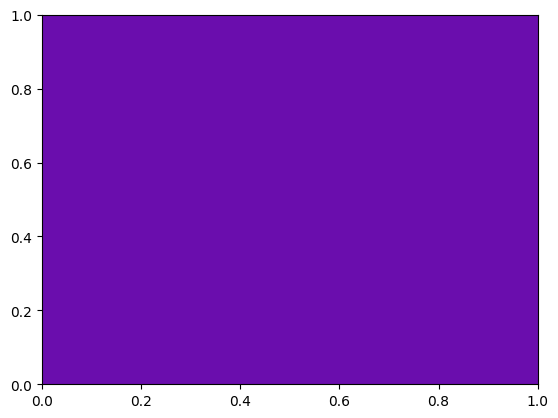

In [ ]:
import matplotlib.patches as matpatches

def plotRGB(rgb_value):
  if (not isinstance(rgb_value, list)) or (not isinstance(rgb_value, tuple)):
    rgb_value = tuple(rgb_value)
  rect1 = matpatches.Rectangle((0,0), 10, 10, color=rgb2hex(rgb_value))
  fig = plt.figure()
  ax = fig.add_subplot(111)
  ax.add_patch(rect1)
  plt.show()

plotRGB(rgb_value=[106,13,173])

In [ ]:
cluster_center_df['ClusterColor'].unique()

array(['#5587e1', '#7d91a5', '#9b5f73', '#a5b991', '#f5cd9b', '#e1cd4b',
       '#eb9b4b', '#e19155', '#73550f', '#554123', '#0f050f', '#5f4b55',
       '#d787a5'], dtype=object)

In [ ]:
def changeRGB4Image(df, rgb_cols, center_cols, cluster_color_dict, cluster_col, img_shape):
    df_ = df.copy()
    img = np.array(df_[rgb_cols]).reshape([img_shape[0], img_shape[1], 3])

    new_img = np.copy(img)
    channels_arr = df_[center_cols].values

    len_cluster_match= {}
    for key, val in cluster_color_dict.items():
        indx = df_.query(f'{cluster_col} =={key}').index
        len_cluster_match[key] = [len(indx), indx]
        channels_arr[indx] = val
        new_img[:,:,0:3]= channels_arr[:,0:3].reshape([img_shape[0], img_shape[1],3])
    DATA = np.array([img, new_img])
    fig = px.imshow(DATA, facet_col=0)
    
    fig.show()
    return(len_cluster_match)

def color_clusters(cluster_center_df, img_indx, col_to_use=[106,13,173]):

  for cluster_indx in range(len(cluster_center_df['ClusterColor'].unique())):
    clusterIndColorPairs = { cluster_indx:col_to_use} #color the point that matches the cluster with purple
    print(f'Plot for cluster {cluster_indx}')
    len_cluster_match = changeRGB4Image(df=cluster_center_df, rgb_cols=[f'R{img_indx}', f'G{img_indx}', f'B{img_indx}'],
                                        center_cols=[f'R{img_indx} center', f'G{img_indx} center', f'B{img_indx} center'],
                                        cluster_color_dict=clusterIndColorPairs, cluster_col='Clusters', img_shape=img_shape)

In [ ]:
cluster_center_df

,R1,G1,B1,R1 center,G1 center,B1 center,Clusters,ClusterColor
0,218,112,103,215,115,105,0,#cd7d5f
1,227,113,97,225,115,95,0,#cd7d5f
2,216,121,92,215,125,95,0,#cd7d5f
3,223,117,74,225,115,75,0,#cd7d5f
4,225,117,72,225,115,75,0,#cd7d5f
...,...,...,...,...,...,...,...,...
262139,208,125,85,205,125,85,0,#cd7d5f
262140,217,121,75,215,125,75,0,#cd7d5f
262141,218,124,79,215,125,75,0,#cd7d5f
262142,219,123,74,215,125,75,0,#cd7d5f


In [ ]:
def do_color_analysis(rgb_df, img_shape, img_indx=0,  cube_width=10, to_plot=True):
  center_df = make_center_df(df=rgb_df, cols=list(rgb_df.columns[(img_indx * 3):((img_indx+1) * 3)]), img_shape=img_shape, cube_width = cube_width, to_plot=to_plot)
  cluster_center_df = cluster_center(df=center_df, center_cols=[f'R{img_indx} center', f'G{img_indx} center', f'B{img_indx} center'], n_cluster=13)
  print("\n")
  color_clusters(cluster_center_df, col_to_use=[106,13,173])
  return(cluster_center_df)

In [ ]:
do_color_analysis(rgb_df, img_shape, img_indx = 0,  cube_width=10, to_plot=False)